In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
plt.style.use('seaborn')
import plotly.graph_objects as go
import plotly.express as px
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)

How feasible will it be if we get to predict the hospitalization duration for a particular patient? We get to:

   1. Better medical treatment,
   
   2. Precise doctor management and maintaining work-life balance for healtchare-workers,
   
   3. Generate better revenues,
   
   4. Get more brand value under a Medical Sector,
   
   5. Patient good review

Primarily, want to focus on the below point:

   Categories present in target feature stay,
        
   Find the age pattern, 
        
   Which department requires longer stay? 
        
   Which hospital code, on an average sees longer stay? 
        
   Average deposit amount under each stay category 


In [103]:
train = pd.read_csv('train_data.csv')

In [104]:
train.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [105]:
train['Stay'].replace('More than 100 Days', '>100', inplace=True)

In [8]:
train.Stay.value_counts()

21-30     87491
11-20     78139
31-40     55159
51-60     35018
0-10      23604
41-50     11743
71-80     10254
>100       6683
81-90      4838
91-100     2765
61-70      2744
Name: Stay, dtype: int64

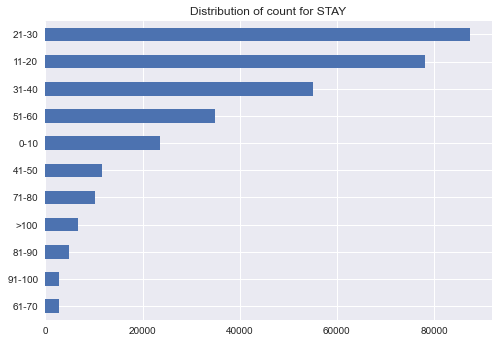

In [9]:
train.Stay.value_counts(ascending=True).plot(kind = 'barh');
plt.title('Distribution of count for STAY');

In [10]:
# For each Stay Category, trying to look for the AGE distribution
stay_age_distribution = pd.get_dummies(train.loc[:,['Stay','Age']], columns=['Age']).groupby('Stay', as_index=False).sum()
stay_age_distribution

,Stay,Age_0-10,Age_11-20,Age_21-30,Age_31-40,Age_41-50,Age_51-60,Age_61-70,Age_71-80,Age_81-90,Age_91-100
0,0-10,615.0,1552.0,3467.0,4916.0,4727.0,3427.0,2194.0,2201.0,422.0,83.0
1,11-20,1959.0,5343.0,11272.0,15792.0,14959.0,11346.0,7870.0,7958.0,1392.0,248.0
2,21-30,1489.0,4312.0,11394.0,18550.0,17906.0,13058.0,9033.0,9534.0,1920.0,295.0
3,31-40,1014.0,2681.0,6912.0,10912.0,10983.0,8569.0,5930.0,6420.0,1504.0,234.0
4,41-50,187.0,510.0,1398.0,2373.0,2507.0,1735.0,1205.0,1383.0,379.0,66.0
5,51-60,582.0,1429.0,3793.0,6517.0,7189.0,5739.0,4081.0,4433.0,1082.0,173.0
6,61-70,26.0,89.0,263.0,509.0,562.0,448.0,325.0,378.0,115.0,29.0
7,71-80,153.0,350.0,1026.0,1807.0,2146.0,1710.0,1230.0,1367.0,402.0,63.0
8,81-90,84.0,223.0,546.0,801.0,885.0,784.0,600.0,670.0,216.0,29.0
9,91-100,35.0,71.0,231.0,484.0,578.0,499.0,330.0,386.0,132.0,19.0


In [11]:
stay_age = stay_age_distribution.columns.tolist()
stay_age.remove('Stay')
print(stay_age)

['Age_0-10', 'Age_11-20', 'Age_21-30', 'Age_31-40', 'Age_41-50', 'Age_51-60', 'Age_61-70', 'Age_71-80', 'Age_81-90', 'Age_91-100']


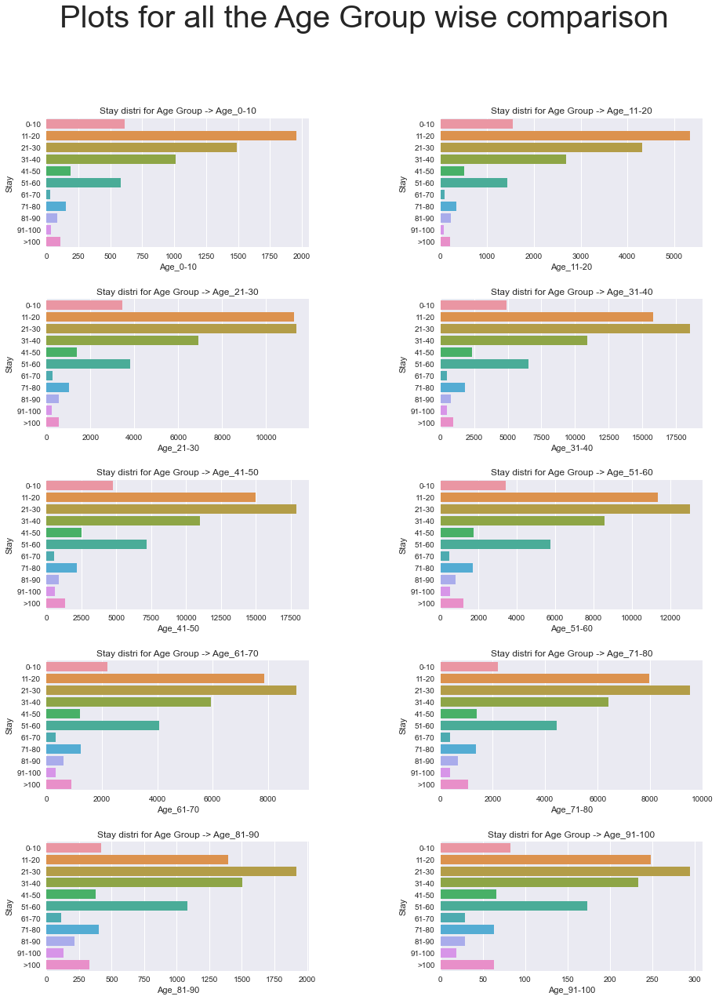

In [12]:
plt.figure(figsize=(15,20))
plt.suptitle("Plots for all the Age Group wise comparison", fontsize=40)
x = 1
for age in stay_age:
    ax = plt.subplot(int(len(stay_age)//2),2,x)
    ax = plt.subplots_adjust(wspace=0.5,hspace=0.4)
    sns.barplot(y = 'Stay',x = age,data = stay_age_distribution,ax = ax)
    plt.title(f'Stay distri for Age Group -> {age}')
    x +=1

So, we can see that the Stay duration of 21-30 days, is highly prominent, which makes it very much curious to me as of what health-problems do generally people come in with that it takes more than 3 weeks to get resolved.

As far as Age pattern is concerend, now let's focus on two Stay - durations:

    21-30 days
    11-20 days.

Why these two?

Well, obvious with the first duration, where as for the second one, want to se whether the same inferences apply for a 2 Months period of time!?



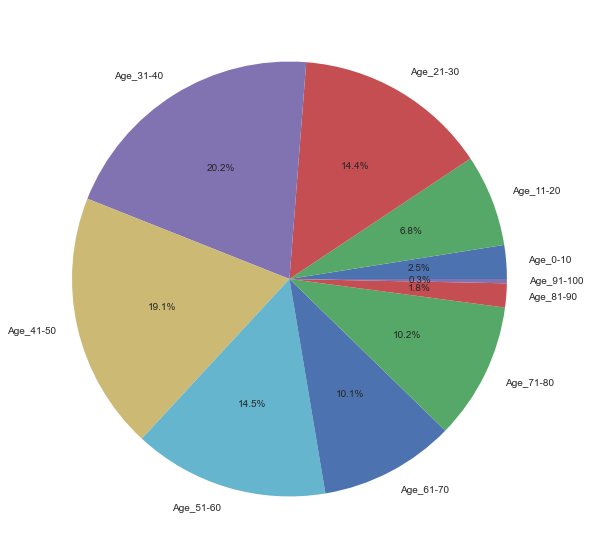

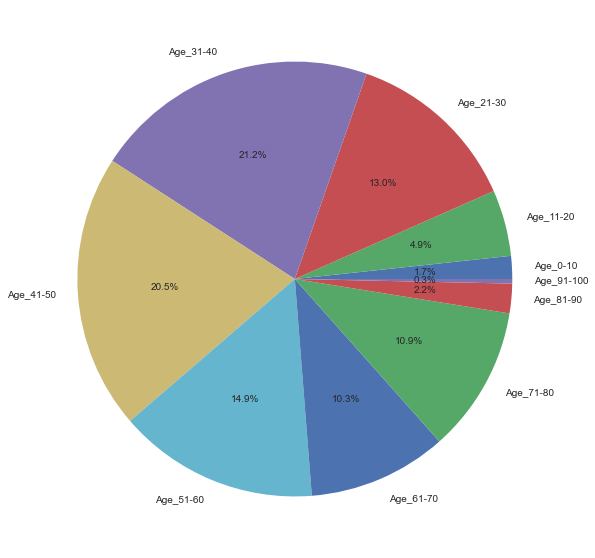

In [13]:
stay_durations = ['21-30','11-20']
stay_specific_data = stay_age_distribution[stay_age_distribution.Stay.isin(stay_durations)].reset_index(drop=True).iloc[:,1:]
for ind in stay_specific_data.index:
    fig, ax = plt.subplots(1,1)
    fig.set_size_inches(10,10)
    stay_specific_data.iloc[ind].plot(kind='pie', ax=ax, autopct='%1.1f%%')
    ax.set_ylabel('')
    ax.set_xlabel('')

So, the first pie-chart is the distribution for 21-30 days, and next one is for 11-20 days.

 The two Age Slots heavily dominating are:

 Age 31-40

  Age 41-50

 I believe, these 20 years are the phase where we move into our adulthood and all the bad habits (in general) we have till 30's startes to kick-in. 
        Bad Habits:
            
            Liqour/Smoking
            
            Junk/un-healthy food
For these two age groups and Stay of days respectively, let's find out the type of Department they are treated in.

In [14]:
dep_stay_age_distri = train.groupby(by = ['Stay','Age','Department'])['Department'].count().reset_index(level='Age')
dep_stay_age_distri

Age  Department
Stay Department                            
0-10 TB & Chest disease    0-10          35
     anesthesia            0-10          41
     gynecology            0-10         449
     radiotherapy          0-10          80
     surgery               0-10          10
...                         ...         ...
>100 radiotherapy         81-90          55
     TB & Chest disease  91-100           1
     anesthesia          91-100           3
     gynecology          91-100          48
     radiotherapy        91-100          11

[529 rows x 2 columns]

In [15]:
dur_21_30 = dep_stay_age_distri[dep_stay_age_distri.index.get_level_values('Stay').isin([stay_durations[0]])].rename(columns = {'Department':'Count of patients'}).reset_index(level=1)
dur_11_20 = dep_stay_age_distri[dep_stay_age_distri.index.get_level_values('Stay').isin([stay_durations[1]])].rename(columns = {'Department':'Count of patients'}).reset_index(level=1)

In [16]:
dur_21_30.head()

,Department,Age,Count of patients
Stay,,,
21-30,TB & Chest disease,0-10,100
21-30,anesthesia,0-10,119
21-30,gynecology,0-10,1021
21-30,radiotherapy,0-10,227
21-30,surgery,0-10,22


In [17]:
dur_11_20.head()

,Department,Age,Count of patients
Stay,,,
11-20,TB & Chest disease,0-10,115
11-20,anesthesia,0-10,149
11-20,gynecology,0-10,1375
11-20,radiotherapy,0-10,304
11-20,surgery,0-10,16


In [18]:
total_21_30 = dur_21_30.groupby('Department')['Count of patients'].sum()
total_11_20 = dur_11_20.groupby('Department')['Count of patients'].sum()
total_21_30

Department
TB & Chest disease     2618
anesthesia             8950
gynecology            68383
radiotherapy           7263
surgery                 277
Name: Count of patients, dtype: int64

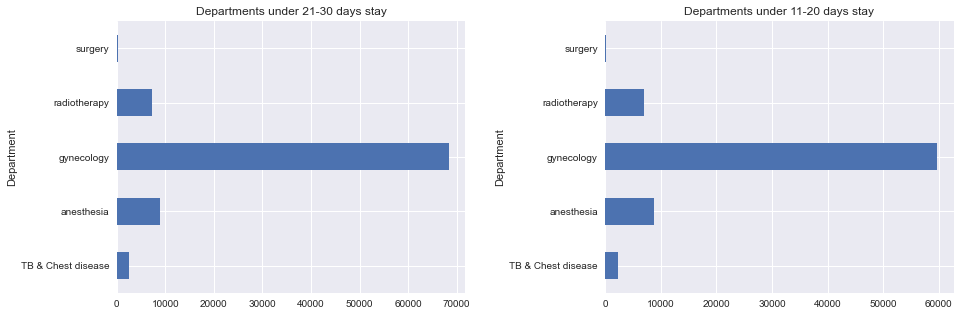

In [19]:
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
plt.subplots_adjust(wspace=0.4,hspace=0.3)
total_21_30.plot(kind = 'barh');
plt.title('Departments under 21-30 days stay');
plt.subplot(1,2,2)
total_11_20.plot(kind = 'barh');
plt.title('Departments under 11-20 days stay');

In [20]:
from pandas_profiling import ProfileReport

In [208]:
profile = ProfileReport(train, title='Profiling Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Gynecology department leads all the way!.
Now this is makes me think, precisely what kind of issues under this category occurs, which may extend 30 days stay to 60 days stay!


Now, moving onto the Hospital Code which sees longer stays. Well, i have thought of using only the above two durations are primary comparison analysis for this. So, the question becomes now that which Hospital Codes sees highest demands for:

  21-30 days stay
  
  
  11-20 days stay

In [22]:
master_duration_df = train[train['Stay'].isin(stay_durations)]
master_duration_df
# Having details for only these 2 number of days of stay

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
5,6,23,a,6,X,2,anesthesia,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,4449.0,11-20
10,11,22,g,9,Y,2,radiotherapy,S,B,2.0,31397,7.0,Urgent,Extreme,2,51-60,5797.0,21-30
11,12,26,b,2,Y,4,radiotherapy,R,D,1.0,31397,7.0,Urgent,Extreme,2,51-60,5993.0,11-20
13,14,9,d,5,Z,3,radiotherapy,S,F,3.0,31397,7.0,Urgent,Extreme,2,51-60,8477.0,21-30
17,18,29,a,4,X,4,anesthesia,S,F,3.0,63418,8.0,Emergency,Extreme,2,71-80,5342.0,11-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318431,318432,23,a,6,X,3,anesthesia,Q,F,4.0,120672,2.0,Urgent,Extreme,2,71-80,4508.0,11-20
318432,318433,26,b,2,Y,2,anesthesia,R,D,3.0,36018,6.0,Emergency,Minor,3,11-20,8308.0,21-30
318433,318434,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20
318435,318436,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20


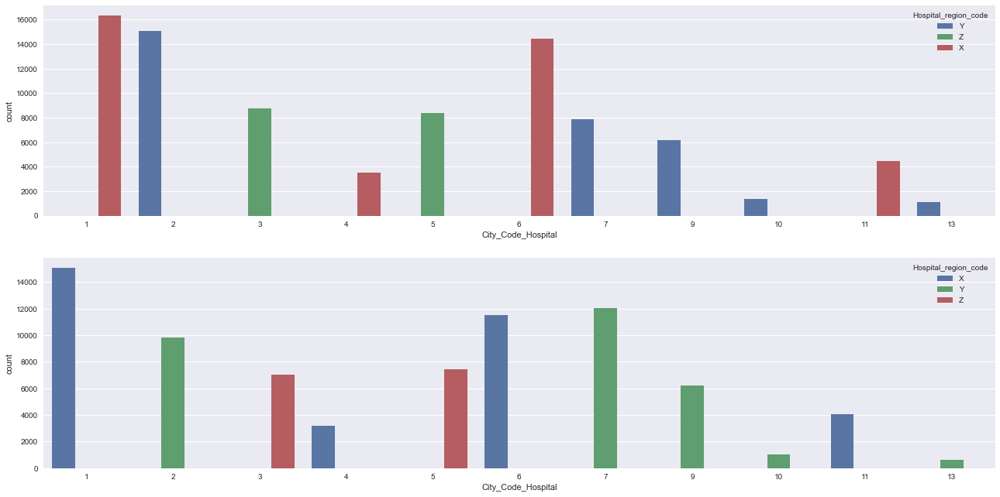

In [23]:
hospital_region_code_21_30 = master_duration_df[master_duration_df.Stay == '21-30']
hospital_region_code_11_20 = master_duration_df[master_duration_df.Stay == '11-20']
plt.figure(figsize=(22,11))
plt.subplot(2,1,1)
sns.countplot(hue = hospital_region_code_21_30['Hospital_region_code'],x = hospital_region_code_21_30['City_Code_Hospital']);
plt.subplot(2,1,2)
sns.countplot(hue = hospital_region_code_11_20['Hospital_region_code'],x = hospital_region_code_11_20['City_Code_Hospital']);

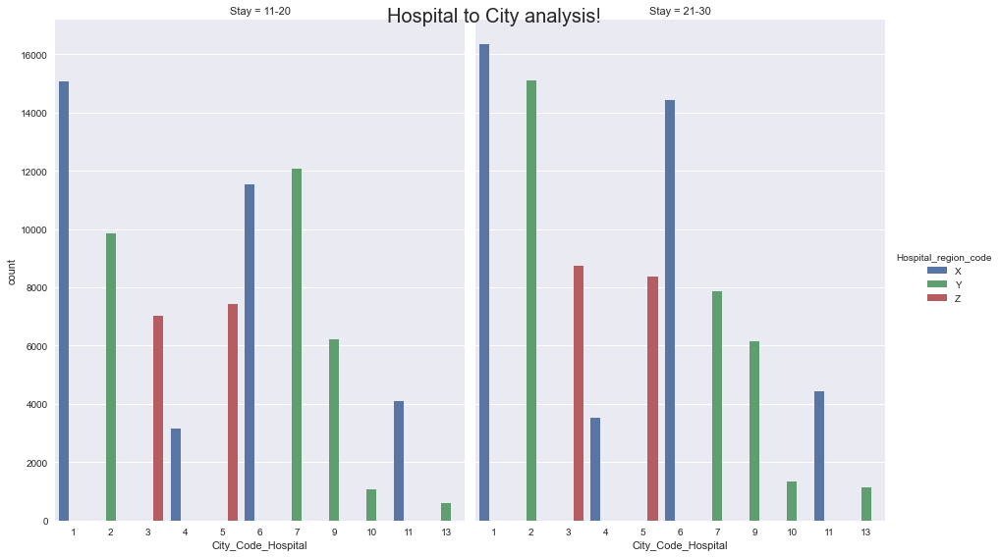

In [24]:
g = sns.catplot(hue="Hospital_region_code", x="City_Code_Hospital", col="Stay",
                data=master_duration_df, kind="count",
                height=8, aspect=.8);
plt.suptitle('Hospital to City analysis!',fontsize = 20);


The count scale for Stay 21-30 is more than 16k, whereas for Stay 11-20 is upto 15k.

Which brings the conclusion:

The Hospital Region X with City code 1 has seen the highest count, for both the duration of Stays, followed by City Code 6 under the same Hospital Region!

This may not confirm the evidence that the duration gets extended in the same hospital 
zone/area/perimeter, but strongly indicates in that direction., let's confirm this with the Severitty of Illness and maybe by type of admission.

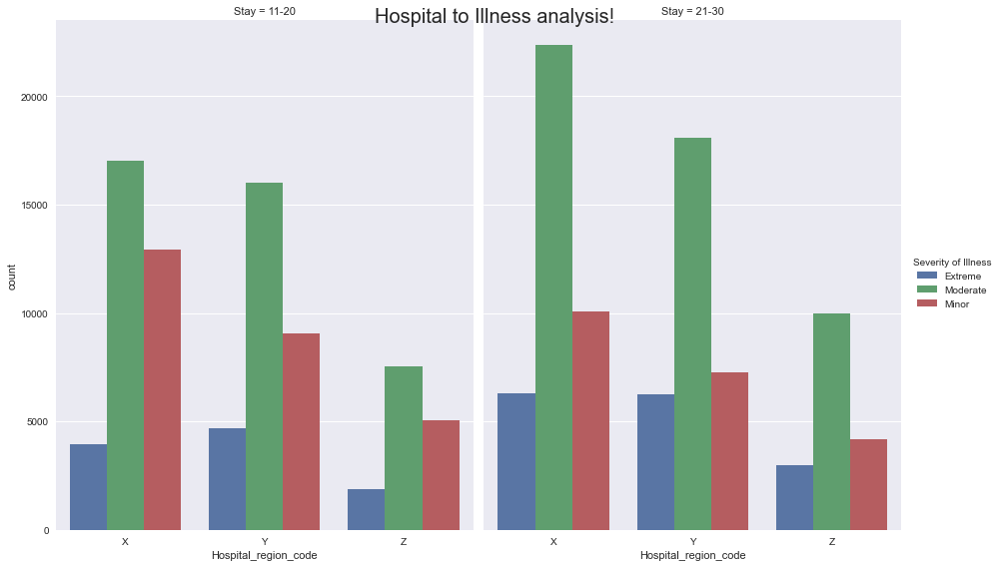

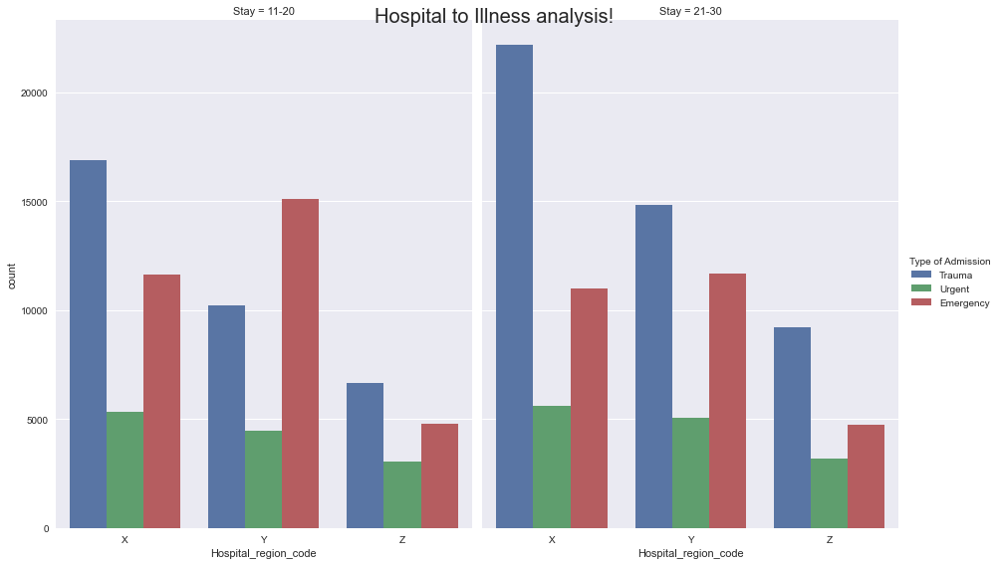

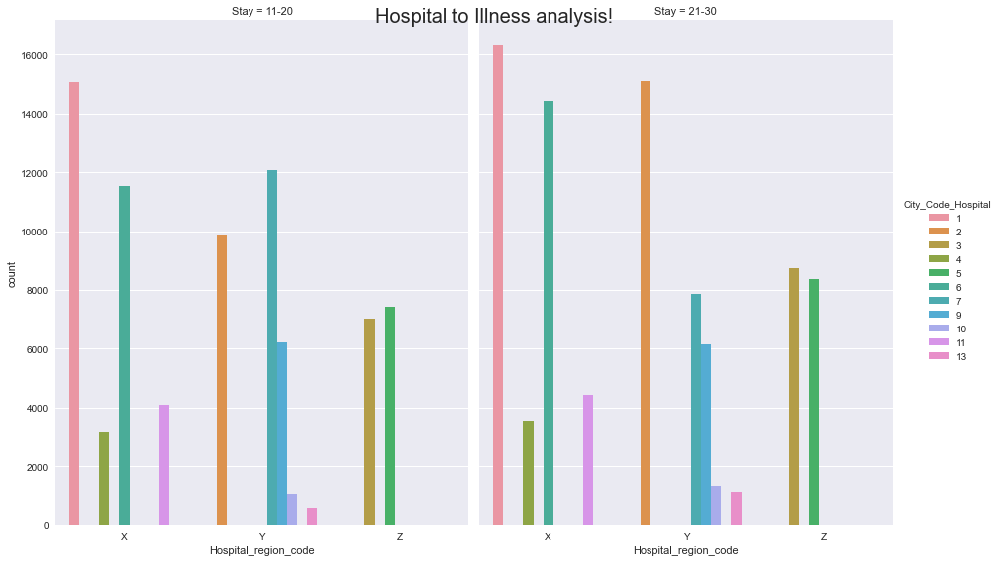

In [25]:
g = sns.catplot(hue="Severity of Illness", x="Hospital_region_code", col="Stay",
                data=master_duration_df, kind="count",
                height=8, aspect=.8);
plt.suptitle('Hospital to Illness analysis!',fontsize = 20);

g = sns.catplot(hue="Type of Admission", x="Hospital_region_code", col="Stay",
                data=master_duration_df, kind="count",
                height=8, aspect=.8);
plt.suptitle('Hospital to Illness analysis!',fontsize = 20);

g = sns.catplot(hue="City_Code_Hospital", x="Hospital_region_code", col="Stay",
                data=master_duration_df, kind="count",
                height=8, aspect=.8);
plt.suptitle('Hospital to Illness analysis!',fontsize = 20);

Now, looking at these charts, i can definitely say that:

The patient treatment started with 21-30 days treatment generally gets extended to 50 weeks,
  
A Better way to say that, patient predicted to get treated in 3 weeks, gets extended to 5-6 weeks, given that the case is of Trauma and Severity is Extreme/Moderate.

Well, given the current situation the world is going through, till date have seen pandemic Covid-19, Economic Crisis,supply chain bottlenecks and Russia vs Ukraine battle, the whole world is in temporary turmoil!

The Hospital Regions X and Y have more visibility than Z, so patients feel comfortable in extending their treatment!

Now, let's try to find the Average Admission amount per Stay duration category!

In [26]:
avg_admission_amount = train.groupby(by = ['Stay','Severity of Illness'])['Admission_Deposit'].mean().reset_index()
avg_admission_amount

,Stay,Severity of Illness,Admission_Deposit
0,0-10,Extreme,4508.653427
1,0-10,Minor,4692.847063
2,0-10,Moderate,4595.078856
3,11-20,Extreme,4787.106104
4,11-20,Minor,5024.140911
5,11-20,Moderate,4906.354736
6,21-30,Extreme,4892.911882
7,21-30,Minor,5142.542512
8,21-30,Moderate,5015.952214
9,31-40,Extreme,4765.498017


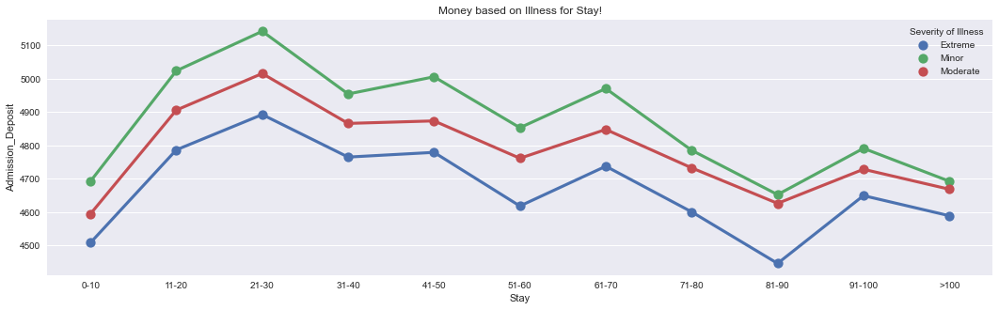

In [27]:
plt.figure(figsize=(18,5))
sns.pointplot(data=avg_admission_amount, y="Admission_Deposit", x="Stay",hue = 'Severity of Illness');
plt.title('Money based on Illness for Stay!');

Let me tell you if you face a MINOR severity, you need to deposit more money. So there lies a pattern of profiteering from the illness of a patient!(Not in our scope of discussion but a pattern which cannot be ignored)

But I can infer, one more thning, the LONG STAY of around 81 to 90 days, require less amount to be deposited, around 4.5k, but I guess, that's where the Medical Insurance plays a role as the amount can be settled as the treatment reaches end!

In [28]:
cat_cols=[]
num_cols=[]

for col in train.columns:
    if train[col].dtypes=='object':
        cat_cols.append(col)
        
for col in train.columns:
    if train[col].dtypes!='object':
        num_cols.append(col)
        
print(cat_cols)
print(num_cols)

['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code', 'Type of Admission', 'Severity of Illness', 'Age', 'Stay']
['case_id', 'Hospital_code', 'City_Code_Hospital', 'Available Extra Rooms in Hospital', 'Bed Grade', 'patientid', 'City_Code_Patient', 'Visitors with Patient', 'Admission_Deposit']


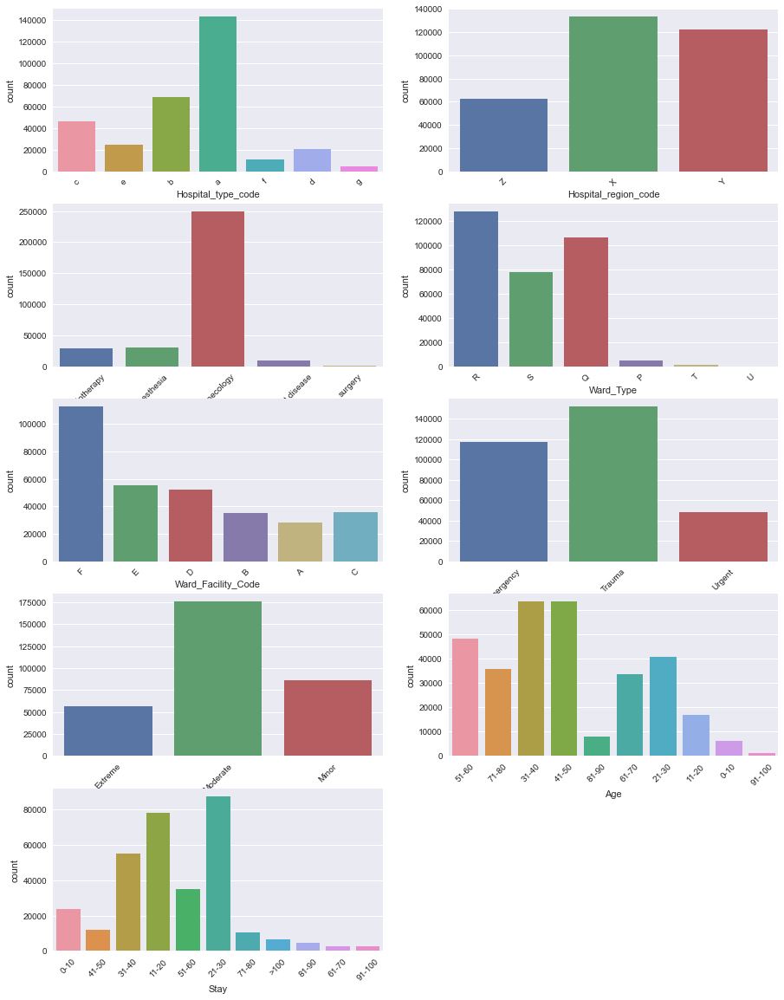

In [29]:
i=1
plt.figure(figsize=(15,20))
for col in cat_cols:
    plt.subplot(5,2,i)
    sns.countplot(x=train[col])
    plt.xticks(rotation=45)
    i=i+1
plt.show()

In [30]:
train['Count']=1
hos_code=train.groupby('Hospital_type_code')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
hos_code

,Hospital_type_code,Count
0,a,143425
1,b,68946
2,c,45928
4,e,24770
3,d,20389
5,f,10703
6,g,4277


In [31]:
fig1=px.bar(hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5,template='plotly')
fig1.show()

Hospital type A has a much higher patient case load when in comparison any of the other hospital codes. Hospital type G has the least case load. Hence, hospital type A has a much higher likelihood of running out of patient beds while G has the least. The ideal distribution would've been a uniform distribution where the under utilised beds of other hospital type codes may have been equally utilised.

In [32]:
fig2=px.sunburst(train,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load diagram',title_x=0.5)
fig2.show()

Case loads in hospital region X is marginally higher than hospital region Y and the least in region Z . For region X, the hospital type A had highest case load while it was more equally balanced between a and b in region Y. For region Z, highest case loads were in hospital type C. Hospitals in region X seem to show better distribution amogst all the hospital types.

For region Y, distribution between A and B is ideal but f,d and g have been under utilised. For Z, cases in hospital c were easily the highest but a and d are extremely under utilised.

In [33]:
fig3=px.histogram(train,x='Available Extra Rooms in Hospital',color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(template='plotly_dark',title='Hospitals with extra rooms',title_x=0.5)
fig3.show()

Majority of hospitals have extra rooms in the size of 2,3 or 4 rooms. The median extra rooms is 3.

In [34]:
beds = train[['Hospital_code','Available Extra Rooms in Hospital','Hospital_region_code']]
beds['Hospital_region_code'] = beds['Hospital_region_code'].map({'X':1,'Y':2,'Z':3})
beds_grouped = beds.groupby('Hospital_code')[['Available Extra Rooms in Hospital','Hospital_region_code']].median().reset_index()

C:\Users\Admin\AppData\Local\Temp\ipykernel_10104\2830514387.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [35]:
beds_grouped['Hospital_region_code'] = beds_grouped['Hospital_region_code'].map({1:'X',2:'Y',3:'Z'})
beds_grouped.head()

,Hospital_code,Available Extra Rooms in Hospital,Hospital_region_code
0,1,3.0,Y
1,2,2.0,Z
2,3,3.0,Z
3,4,3.0,X
4,5,3.0,X


In [36]:
beds_1=beds_grouped.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index()
fig4=px.pie(beds_1,values='Available Extra Rooms in Hospital',names='Hospital_region_code',hole=0.7)
fig4.update_layout(title='Number of extra rooms in each region code',title_x=0.7)
fig4.update_traces(textinfo='percent+label')

The number of extra available rooms are almost equally distributed amongst the three region codes. This is an ideal scenario for bed availability.

In [37]:
fig5=px.sunburst(train,path=['Age','Severity of Illness'])
fig5.update_layout(title='Age (in years) and Severity of Illness',title_x=0.4)
fig5.show()

Extreme cases are least for each age group. However, the extreme cases in relation to the moderate and minor cases seem to increase with higher age groups.

In [38]:
fig6=px.sunburst(train,path=['Stay','Severity of Illness'])
fig6.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig6.show()

It is seen that generally for lower stay duration(upto 20 days), the severity of illness is majorly minor or moderate. For higher stay duration, the extreme severity cases start rising.

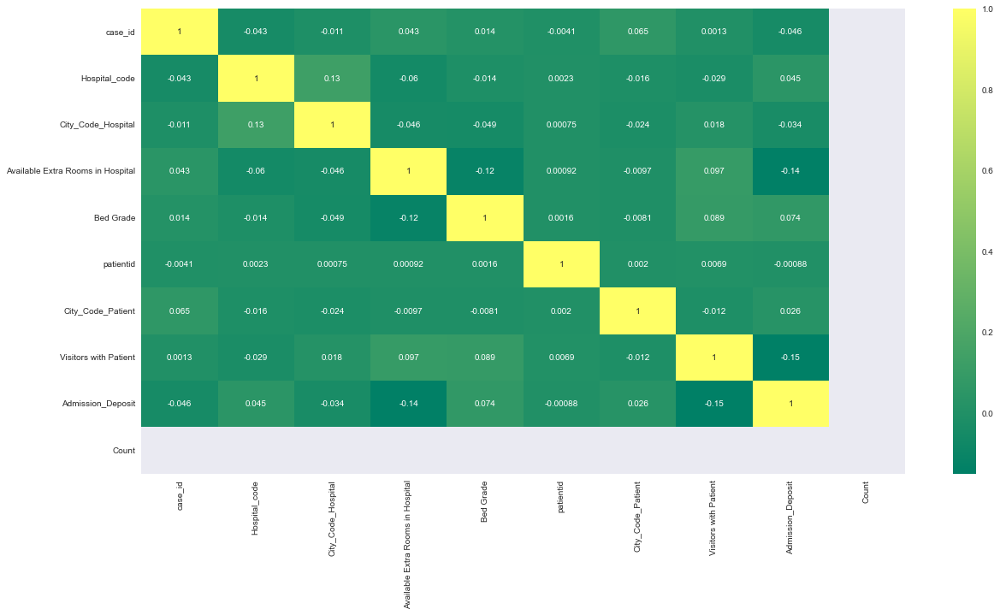

In [39]:
correlations = train.corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlations,cmap='summer',annot=True,fmt='.2g');

So, all our EDA's are done,✅

 We saw, most prominent Admitting duration(s) are:
    21-30 and 11-20 days.
    
Most of the Patients under these two are being treated in Gynecology department
    
Most cases of average 3 weeks are getting extended to 5 weeks duration.
    
Mostly the converted cases are of Trauma with Moderate/Extreme severity
    
Finally, looks like if the case is of Extreme condition, Medical Insurance kicks in and the admission average money is comparitvely low

Now, let's move towards Data-Engineering part and prepare a Dataset suitable for predicting 

# Model Building

Here, I divide the stay duration into 3 categories 0: 0-20 days 1: 21-60 days 2: 61-100+ days

You might say why a disproportionate distribution. This is to balance the number of patients in each category

Plus the model will not give good prediction accuracy if there are 11 classes to predict. It would have given good results if there were a proportionate number of rows give, example 10,00,000 but with the amount of data we have, we can get a decent accuracy with 3 labels to predict.But for the sake of building a model I try to first predict 11 classes

In [106]:
train1 = train.copy()
train2 = train.copy()
train3 = train.copy()
train4 = train.copy()

In [107]:
train1.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


In [108]:
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

In [77]:
#train.drop('Count',axis=1,inplace=True)

In [109]:
train1.isnull().sum()

case_id                                 0
Hospital_code                           0
Hospital_type_code                      0
City_Code_Hospital                      0
Hospital_region_code                    0
Available Extra Rooms in Hospital       0
Department                              0
Ward_Type                               0
Ward_Facility_Code                      0
Bed Grade                             113
patientid                               0
City_Code_Patient                    4532
Type of Admission                       0
Severity of Illness                     0
Visitors with Patient                   0
Age                                     0
Admission_Deposit                       0
Stay                                    0
dtype: int64

In [110]:
import statistics as st
train1['Bed Grade'].fillna(st.mode(train1['Bed Grade']),inplace=True)
train1['City_Code_Patient'].fillna(st.mode(train1['City_Code_Patient']),inplace=True)

In [111]:
train1.isnull().sum()

case_id                              0
Hospital_code                        0
Hospital_type_code                   0
City_Code_Hospital                   0
Hospital_region_code                 0
Available Extra Rooms in Hospital    0
Department                           0
Ward_Type                            0
Ward_Facility_Code                   0
Bed Grade                            0
patientid                            0
City_Code_Patient                    0
Type of Admission                    0
Severity of Illness                  0
Visitors with Patient                0
Age                                  0
Admission_Deposit                    0
Stay                                 0
dtype: int64

In [112]:
encode = {
    '0-10' : 1, '11-20' : 2, '21-30' : 3, '31-40' : 4, '41-50' : 5, '51-60' : 6, '61-70' : 7, '71-80' : 8,
    '81-90' : 9, '91-100' : 10
}
train1['Age'] = train1['Age'].map(encode)
encode = {
    'radiotherapy' : 1, 'anesthesia' : 2, 'gynecology' : 3, 'TB & Chest disease' : 4, 'surgery' : 5}
train1['Department'] = train1['Department'].map(encode)
encode = {
    'R' : 1, 'S' : 2, 'Q' : 3, 'P' : 4, 'T' : 5, 'U' : 6}
train1['Ward_Type'] = train1['Ward_Type'].map(encode)
encode = {
    'F' : 1, 'E' : 2, 'D' : 3, 'B' : 4, 'A' : 5, 'C' : 6}
train1['Ward_Facility_Code'] = train1['Ward_Facility_Code'].map(encode)
encode = {
    'Emergency' : 1, 'Trauma' : 2, 'Urgent' : 3}
train1['Type of Admission'] = train1['Type of Admission'].map(encode)
encode = {
    'Extreme' : 1, 'Moderate' : 2, 'Minor' : 3}
train1['Severity of Illness'] = train1['Severity of Illness'].map(encode)
encode = {
    'c' : 1, 'e' : 2, 'b' : 3, 'a' : 4, 'f' : 5, 'd' : 6 , 'g' : 7}
train1['Hospital_type_code'] = train1['Hospital_type_code'].map(encode)
encode = {
    'Z' : 1, 'X' : 2, 'Y' : 3}
train1['Hospital_region_code'] = train1['Hospital_region_code'].map(encode)

In [113]:
encode = {
    '0-10' : 1, '11-20' : 2, '21-30' : 3, '31-40' : 4, '41-50' : 5, '51-60' : 6, '61-70' : 7, '71-80' : 8,
    '81-90' : 9, '91-100' : 10, '>100' : 11
}
train1['Stay'] = train1['Stay'].map(encode)

In [114]:
train1.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,1,3,1,3,1,1,1,2.0,31397,7.0,1,1,2,6,4911.0,1
1,2,2,1,5,1,2,1,2,1,2.0,31397,7.0,2,1,2,6,5954.0,5
2,3,10,2,1,2,2,2,2,2,2.0,31397,7.0,2,1,2,6,4745.0,4
3,4,26,3,2,3,2,1,1,3,2.0,31397,7.0,2,1,2,6,7272.0,5
4,5,26,3,2,3,2,1,2,3,2.0,31397,7.0,2,1,2,6,5558.0,5


In [115]:
train1.drop(['case_id','patientid'],axis=1,inplace=True)

In [123]:
train1.head()

,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,8,1,3,1,3,1,1,1,2.0,7.0,1,1,2,6,4911.0,1
1,2,1,5,1,2,1,2,1,2.0,7.0,2,1,2,6,5954.0,5
2,10,2,1,2,2,2,2,2,2.0,7.0,2,1,2,6,4745.0,4
3,26,3,2,3,2,1,1,3,2.0,7.0,2,1,2,6,7272.0,5
4,26,3,2,3,2,1,2,3,2.0,7.0,2,1,2,6,5558.0,5


In [131]:
x=train1.loc[:, train1.columns != 'Stay']
y=train1['Stay']

In [132]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.25, random_state=42, stratify=y)

In [133]:
from collections import Counter

counter = Counter(y)
for k, v in counter.items():
    dist = v / len(y) * 100
    print(f"Class={k}, n={v} ({dist}%)")

Class=1, n=23604 (7.412431933374785%)
Class=5, n=11743 (3.6876880271826855%)
Class=4, n=55159 (17.321739239663607%)
Class=2, n=78139 (24.538214660310643%)
Class=6, n=35018 (10.996803145353255%)
Class=3, n=87491 (27.475050088243236%)
Class=8, n=10254 (3.220093079343546%)
Class=11, n=6683 (2.0986816899993093%)
Class=9, n=4838 (1.519291039386003%)
Class=7, n=2744 (0.8617062034053725%)
Class=10, n=2765 (0.8683008937375565%)


In [134]:
from imblearn.over_sampling import SMOTE

In [135]:
sm = SMOTE(random_state=10)
x,y = sm.fit_resample(x,y)
#df10 = pd.concat([pd.DataFrame(y), pd.DataFrame(x)], axis=1)

In [136]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.25, random_state=42, stratify=y)

In [137]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
forestVC = RandomForestClassifier()
modelVC1 = forestVC.fit(xtrain, ytrain) 
pred = modelVC1.predict(xtest)
accuracy = accuracy_score(ytest, pred)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 66.75%


In [138]:
modelVC1.score(xtrain,ytrain)

0.9998489886395123

In [142]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

model_ada = AdaBoostClassifier(random_state=101)
model_ada.fit(xtrain, ytrain)

pred4 = model_ada.predict(xtest)

print("Training Accuracy: ", model_ada.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_ada.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred4)
print(cr)

# making a confusion matrix
#ConfusionMatrixDisplay.from_predictions(ytest,pred4);

Training Accuracy:  0.2927306733167082
Testing Accuarcy:  0.291012921808305
              precision    recall  f1-score   support

           1       0.27      0.50      0.35     21872
           2       0.34      0.34      0.34     21873
           3       0.37      0.29      0.32     21873
           4       0.21      0.16      0.18     21873
           5       0.24      0.14      0.17     21873
           6       0.29      0.26      0.27     21872
           7       0.25      0.32      0.28     21873
           8       0.24      0.16      0.19     21873
           9       0.32      0.49      0.38     21873
          10       0.28      0.26      0.27     21873
          11       0.42      0.29      0.35     21873

    accuracy                           0.29    240601
   macro avg       0.29      0.29      0.28    240601
weighted avg       0.29      0.29      0.28    240601



## The accuracy is a very below par 0.29 which doesn't bode well with our expectations. Now as stated above using only 3 labels for predicting i.e amalgamation of the 11 labels into 3 labels

In [143]:
train2['Stay']= train2['Stay'].replace({'0-10':0, '11-20':0, '21-30':1, '31-40':1, '41-50':1, '51-60':2,'61-70':2,'71-80':2,'81-90':2,'91-100':2,'>100':2})

In [144]:
import statistics as st
train2['Bed Grade'].fillna(st.mode(train2['Bed Grade']),inplace=True)
train2['City_Code_Patient'].fillna(st.mode(train2['City_Code_Patient']),inplace=True)

In [145]:
train2.drop(['case_id','patientid'],axis=1,inplace=True)

In [146]:
cat_cols=[]
num_cols=[]

for col in train2.columns:
    if train2[col].dtypes=='object':
        cat_cols.append(col)
        
for col in train2.columns:
    if train2[col].dtypes!='object':
        num_cols.append(col)
        
print(cat_cols)
print(num_cols)

['Hospital_type_code', 'Hospital_region_code', 'Department', 'Ward_Type', 'Ward_Facility_Code', 'Type of Admission', 'Severity of Illness', 'Age']
['Hospital_code', 'City_Code_Hospital', 'Available Extra Rooms in Hospital', 'Bed Grade', 'City_Code_Patient', 'Visitors with Patient', 'Admission_Deposit', 'Stay']


In [147]:
from sklearn.preprocessing import LabelEncoder

le= LabelEncoder()
cat_cols.append('Bed Grade')
cat_cols.append('City_Code_Hospital')
cat_cols.append('City_Code_Patient')
for col in cat_cols:
    train2[col]= le.fit_transform(train2[col])

In [148]:
num_cols.remove('Bed Grade')
num_cols.remove('City_Code_Hospital')
num_cols.remove('City_Code_Patient')
num_cols

['Hospital_code',
 'Available Extra Rooms in Hospital',
 'Visitors with Patient',
 'Admission_Deposit',
 'Stay']

In [155]:
#from sklearn.model_selection import train_test_split
y= train2['Stay']
x= train2.drop('Stay', axis=1)

In [163]:
train2['Stay'].value_counts()

1    154393
0    101743
2     62302
Name: Stay, dtype: int64

In [156]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=101)
x,y = sm.fit_resample(x,y)

In [157]:
from sklearn.model_selection import train_test_split
xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size=0.2, random_state=42, stratify=y)

In [164]:
print('x_train :',xtrain.shape)
print('x_test  :',xtest.shape)
print('y_train :',ytrain.shape)
print('y_test  :',ytest.shape)

x_train : (370543, 15)
x_test  : (92636, 15)
y_train : (370543,)
y_test  : (92636,)


# I will be using 4 ML models AdaBoost , GradientBoost,XGBClassifier,LGBM and RandomForest. The best model will be then chosen for parameter tuning.

Training Accuracy:  0.6230019188056447
Testing Accuarcy:  0.6245735998963686
              precision    recall  f1-score   support

           0       0.58      0.64      0.61     30878
           1       0.53      0.48      0.51     30879
           2       0.75      0.75      0.75     30879

    accuracy                           0.62     92636
   macro avg       0.62      0.62      0.62     92636
weighted avg       0.62      0.62      0.62     92636



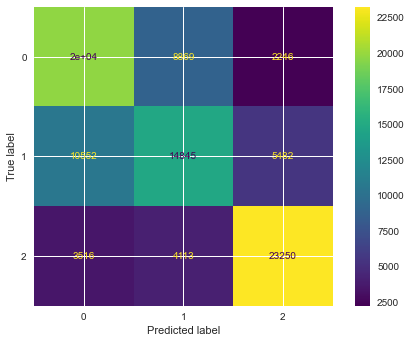

In [158]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report,ConfusionMatrixDisplay

model_ada = AdaBoostClassifier(random_state=101)
model_ada.fit(xtrain, ytrain)

pred4 = model_ada.predict(xtest)

print("Training Accuracy: ", model_ada.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_ada.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred4)
print(cr)

# making a confusion matrix
ConfusionMatrixDisplay.from_predictions(ytest,pred4);

Training Accuracy:  0.6650294297827782
Testing Accuarcy:  0.6621615786519279
              precision    recall  f1-score   support

           0       0.62      0.66      0.64     30878
           1       0.58      0.55      0.56     30879
           2       0.77      0.78      0.78     30879

    accuracy                           0.66     92636
   macro avg       0.66      0.66      0.66     92636
weighted avg       0.66      0.66      0.66     92636



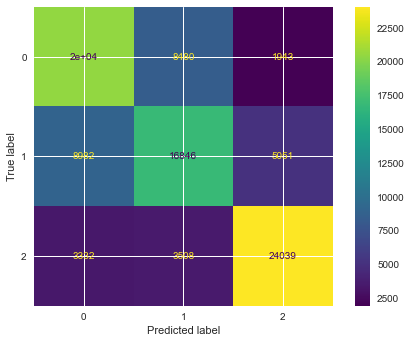

In [161]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report,ConfusionMatrixDisplay

model_gra = GradientBoostingClassifier(n_estimators=300,random_state=101)
model_gra.fit(xtrain, ytrain)

pred5 = model_gra.predict(xtest)

print("Training Accuracy: ", model_gra.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_gra.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred5)
print(cr)
# making a confusion matrix
ConfusionMatrixDisplay.from_predictions(ytest,pred5);

Training Accuracy:  0.7049114407774536
Testing Accuarcy:  0.6798328943391339
              precision    recall  f1-score   support

           0       0.64      0.67      0.66     30878
           1       0.60      0.57      0.59     30879
           2       0.79      0.80      0.80     30879

    accuracy                           0.68     92636
   macro avg       0.68      0.68      0.68     92636
weighted avg       0.68      0.68      0.68     92636



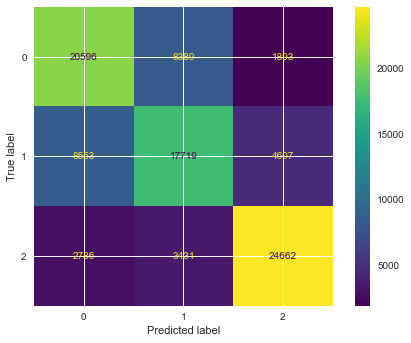

In [167]:
# Xg-Boost Classifier
from xgboost.sklearn import XGBClassifier
model_xgb = XGBClassifier(n_estimators=200,eval_metric='mlogloss')
model_xgb.fit(xtrain, ytrain)

pred6 = model_xgb.predict(xtest)

print("Training Accuracy: ", model_xgb.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_xgb.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred6)
print(cr)

# making a confusion matrix
ConfusionMatrixDisplay.from_predictions(ytest,pred6);

Training Accuracy:  0.9997867993728123
Testing Accuarcy:  0.6714884062351569
              precision    recall  f1-score   support

           0       0.63      0.66      0.65     30878
           1       0.59      0.54      0.56     30879
           2       0.79      0.81      0.80     30879

    accuracy                           0.67     92636
   macro avg       0.67      0.67      0.67     92636
weighted avg       0.67      0.67      0.67     92636



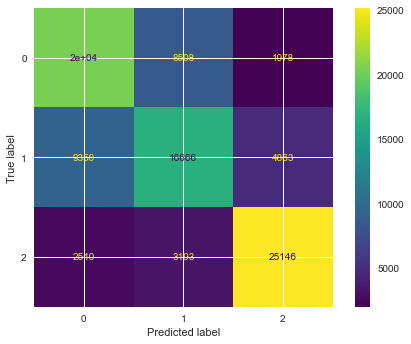

In [165]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier(n_estimators=100,random_state=10)
model_rf.fit(xtrain, ytrain)

pred3 = model_rf.predict(xtest)

print("Training Accuracy: ", model_rf.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_rf.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred3)
print(cr)

# making a confusion matrix
ConfusionMatrixDisplay.from_predictions(ytest,pred3);

Training Accuracy:  0.6735925385177969
Testing Accuarcy:  0.6695992918519797
              precision    recall  f1-score   support

           0       0.63      0.67      0.65     30878
           1       0.60      0.55      0.57     30879
           2       0.78      0.79      0.78     30879

    accuracy                           0.67     92636
   macro avg       0.67      0.67      0.67     92636
weighted avg       0.67      0.67      0.67     92636



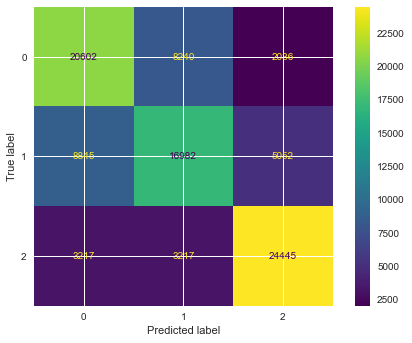

In [173]:
import lightgbm as lgb
model_lgb = lgb.LGBMClassifier(learning_rate=0.09, random_state=42)
model_lgb.fit(xtrain, ytrain)

pred7 = model_lgb.predict(xtest)

print("Training Accuracy: ", model_lgb.score(xtrain, ytrain))
print('Testing Accuarcy: ', model_lgb.score(xtest, ytest))

# making a classification report
cr = classification_report(ytest,  pred7)
print(cr)

# making a confusion matrix
ConfusionMatrixDisplay.from_predictions(ytest,pred7);

# The XGB classifier seems to have a better performance so doing parameter tuning for it.

In [174]:
from sklearn.model_selection import RandomizedSearchCV
params= {'objective':['binary:logistic'],
              'max_depth': [3,4,5,6],
              'min_child_weight': [1,5,10,12],
              'subsample': [0.6,0.8,1.0],
              'colsample_bytree': [0.6,0.8,1.0], 'gamma': [0.5,1,1.5,2]}

xgb= XGBClassifier(n_estimators=600)

grid= RandomizedSearchCV(xgb, cv=3, verbose=3,param_distributions= params, n_iter=5)
grid.fit(x,y)

Fitting 3 folds for each of 5 candidates, totalling 15 fits
[CV 1/3] END colsample_bytree=1.0, gamma=2, max_depth=3, min_child_weight=5, objective=binary:logistic, subsample=0.8;, score=0.582 total time= 5.0min
[CV 2/3] END colsample_bytree=1.0, gamma=2, max_depth=3, min_child_weight=5, objective=binary:logistic, subsample=0.8;, score=0.617 total time= 4.7min
[CV 3/3] END colsample_bytree=1.0, gamma=2, max_depth=3, min_child_weight=5, objective=binary:logistic, subsample=0.8;, score=0.616 total time= 4.6min
[CV 1/3] END colsample_bytree=1.0, gamma=0.5, max_depth=3, min_child_weight=10, objective=binary:logistic, subsample=1.0;, score=0.582 total time= 3.7min
[CV 2/3] END colsample_bytree=1.0, gamma=0.5, max_depth=3, min_child_weight=10, objective=binary:logistic, subsample=1.0;, score=0.616 total time= 3.4min
[CV 3/3] END colsample_bytree=1.0, gamma=0.5, max_depth=3, min_child_weight=10, objective=binary:logistic, subsample=1.0;, score=0.611 total time= 2.9min
[CV 1/3] END colsample_by

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_rate=None, max_bin=None,...
                                           monotone_constraints=None,
                                           n_estimators=600, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=None,
                                           reg_alpha=None, reg_lambda=None, ...),
                   n_iter=5,
                   param_distributions={'colsample_bytree': [0.6, 0.8, 1.0],
                                        'gamma': [0.5, 1, 1.5, 2],
                                        'max_depth': [3, 4, 5, 6],
                                        'min_child_weight': [1, 5, 10, 12],
                                        'objective': ['binary:logistic'],
                                        'subsample': [0.6, 0.8, 1.0]},
                   verbose=3)

In [176]:
grid.best_score_

0.6151099251045492

In [180]:
y_pred= grid.best_estimator_.predict(xtest)
print(accuracy_score(ytest,y_pred))
print(confusion_matrix(ytest,y_pred))
print(classification_report(ytest,y_pred))
print(grid.score(xtest,ytest))
print(grid.score(xtrain,ytrain))

0.7304071851116197
[[22077  7263  1538]
 [ 7139 19913  3827]
 [ 2249  2958 25672]]
              precision    recall  f1-score   support

           0       0.70      0.71      0.71     30878
           1       0.66      0.64      0.65     30879
           2       0.83      0.83      0.83     30879

    accuracy                           0.73     92636
   macro avg       0.73      0.73      0.73     92636
weighted avg       0.73      0.73      0.73     92636

0.7304071851116197
0.7299179852270856


# The model gives 73% accuracy when there are 3 labels after parameter tuning. So now I'll use test data to make final predictions.

# Test data

In [200]:
test = pd.read_csv('test_data.csv')
test.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit
0,318439,21,c,3,Z,3,gynecology,S,A,2.0,17006,2.0,Emergency,Moderate,2,71-80,3095.0
1,318440,29,a,4,X,2,gynecology,S,F,2.0,17006,2.0,Trauma,Moderate,4,71-80,4018.0
2,318441,26,b,2,Y,3,gynecology,Q,D,4.0,17006,2.0,Emergency,Moderate,3,71-80,4492.0
3,318442,6,a,6,X,3,gynecology,Q,F,2.0,17006,2.0,Trauma,Moderate,3,71-80,4173.0
4,318443,28,b,11,X,2,gynecology,R,F,2.0,17006,2.0,Trauma,Moderate,4,71-80,4161.0


In [202]:
test['Bed Grade'].fillna(st.mode(test['Bed Grade']),inplace=True)
test['City_Code_Patient'].fillna(st.mode(test['City_Code_Patient']),inplace=True)

In [203]:
test.drop(['case_id', 'patientid'], axis=1, inplace=True)

In [204]:
for col in cat_cols:
    
    test[col]= le.fit_transform(test[col])

In [205]:
predictions= grid.best_estimator_.predict(test)

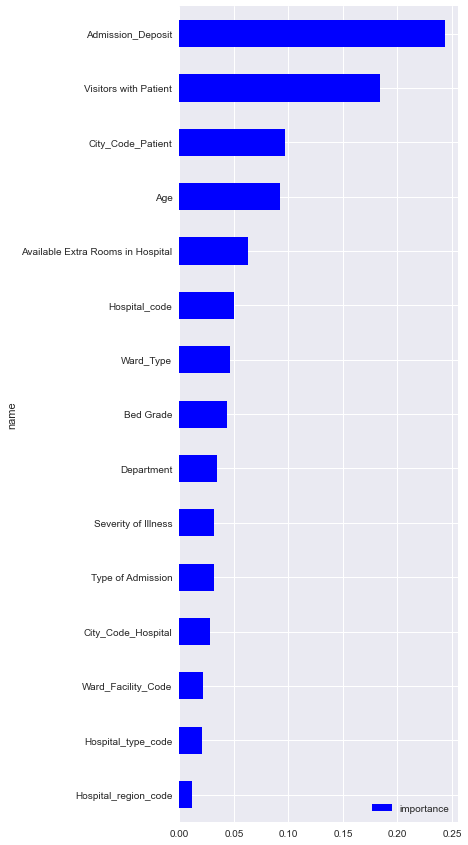

In [206]:
feature = pd.DataFrame()
xtrain1 = pd.DataFrame(xtrain)

feature['name'] = xtrain1.columns
feature['importance'] = grid.best_estimator_.feature_importances_

feature.sort_values(by = ['importance'], ascending = True, inplace = True)
feature.set_index('name', inplace = True)

feature.plot(kind = 'barh', color = 'blue', figsize = (5, 15), fontsize = 10);

# The Admission Deposit seems to be the most feature for predicting the stay of the patient. 

In [195]:
submission = pd.read_csv('sample_sub.csv')
submission.head()

,case_id,Stay
0,318439,0-10
1,318440,0-10
2,318441,0-10
3,318442,0-10
4,318443,0-10


In [196]:
submission['Stay']= predictions
submission['Stay']= submission['Stay'].replace({0:'Less than 20 days', 1:'21-50 days', 2:'51-100+ days'})

In [197]:
submission.head()

,case_id,Stay
0,318439,Less than 20 days
1,318440,51-100+ days
2,318441,21-50 days
3,318442,21-50 days
4,318443,51-100+ days


In [198]:
submission.to_csv(r'Submission.csv', index = False, header = True)